In [8]:
%reset
%matplotlib inline
import numpy as np
import scipy.io as sio
import netCDF4 as nc
import glob, os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import matplotlib
matplotlib.rcParams['animation.embed_limit'] =10000000000000000000000000.0

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


## Reading in data. Experiment 7 is reference, Experiment 17 is subcritical (wide mouth), Experiment 18 is strong wind.

In [9]:
%cd /work0/eay/MITgcm_data/Experiment7/
file7_1 = nc.Dataset('Salt.nc')
file7_2 = nc.Dataset('U.nc')
file7_3 = nc.Dataset('V.nc')
NX7 = 600
NY7 = 1000
NZ7 = 120

xq7 = (file7_1.variables['X'][:])
yq7 = (file7_1.variables['Y'][:])
zl7 = (file7_1.variables['Z'][:])
Time7 = file7_1.variables['T'][:]
print(Time7.shape)

xqmat7=np.tile(xq7,(NY7,1))
yqmat7=np.tile(yq7,(NX7,1))
yqmat7=np.transpose(yqmat7)
print(yqmat7.shape)
print(xqmat7.shape)
%cd /work0/eay/MITgcm_data/

/work0/eay/MITgcm_data/Experiment7
(150,)
(1000, 600)
(1000, 600)
/work0/eay/MITgcm_data


In [10]:
%cd /work0/eay/MITgcm_data/Experiment17/
file17_1 = nc.Dataset('Salt.nc')
file17_2 = nc.Dataset('U.nc')
file17_3 = nc.Dataset('V.nc')
NX17 = 600
NY17 = 1000
NZ17 = 120

xq17 = (file17_1.variables['X'][:])
yq17 = (file17_1.variables['Y'][:])
zl17 = (file17_1.variables['Z'][:])
Time17 = file17_1.variables['T'][:]
print(Time17.shape)

xqmat17=np.tile(xq17,(NY17,1))
yqmat17=np.tile(yq17,(NX17,1))
yqmat17=np.transpose(yqmat17)
print(yqmat17.shape)
print(xqmat17.shape)
%cd /work0/eay/MITgcm_data/

/work0/eay/MITgcm_data/Experiment17
(150,)
(1000, 600)
(1000, 600)
/work0/eay/MITgcm_data


In [11]:
%cd /work0/eay/MITgcm_data/Experiment18/
file18_1 = nc.Dataset('Salt.nc')
file18_2 = nc.Dataset('U.nc')
file18_3 = nc.Dataset('V.nc')
NX18 = 600
NY18 = 1000
NZ18 = 120

xq18 = (file18_1.variables['X'][:])
yq18 = (file18_1.variables['Y'][:])
zl18 = (file18_1.variables['Z'][:])
Time18 = file18_1.variables['T'][:]
print(Time18.shape)

xqmat18=np.tile(xq18,(NY18,1))
yqmat18=np.tile(yq18,(NX18,1))
yqmat18=np.transpose(yqmat18)
print(yqmat18.shape)
print(xqmat18.shape)
%cd /work0/eay/MITgcm_data/

/work0/eay/MITgcm_data/Experiment18
(150,)
(1000, 600)
(1000, 600)
/work0/eay/MITgcm_data


In [12]:
index = 149



mask7 = file7_1.variables['S'][0,0,:,:];   newmask7  = file7_1.variables['S'][0,:,:,:]
mask17 = file17_1.variables['S'][0,0,:,:]; newmask17 = file17_1.variables['S'][0,:,:,:]
mask18 = file18_1.variables['S'][0,0,:,:]; newmask18 = file18_1.variables['S'][0,:,:,:]


Salt7 = file7_1.variables['S'][index,:,:,:]; Salt7[newmask7==0]=np.nan
Sref7 = Salt7*0.0+34.0
hf7=0.1*np.nansum((Sref7-Salt7)/34.0,axis=0)
hf7[(mask7==0)]=-10000000

Salt17 = file17_1.variables['S'][index,:,:,:]; Salt17[newmask17==0]=np.nan
Sref17 = Salt17*0.0+34.0
hf17=0.1*np.nansum((Sref17-Salt17)/34.0,axis=0)
hf17[(mask17==0)]=-10000000

Salt18 = file18_1.variables['S'][index,:,:,:]; Salt18[newmask18==0]=np.nan
Sref18 = Salt18*0.0+34.0
hf18=0.1*np.nansum((Sref18-Salt18)/34.0,axis=0)
hf18[(mask18==0)]=-10000000

hf7[(mask7==0)]=np.nan; hf17[(mask17==0)]=np.nan; hf18[(mask18==0)]=np.nan
hf7_alongshore = np.nansum(hf7*100,axis=0) #100m grid spacing
hf17_alongshore = np.nansum(hf17*100,axis=0) #100m grid spacing
hf18_alongshore = np.nansum(hf18*100,axis=0) #100m grid spacing
# hf_alongshore.shape


print('done!')

done!


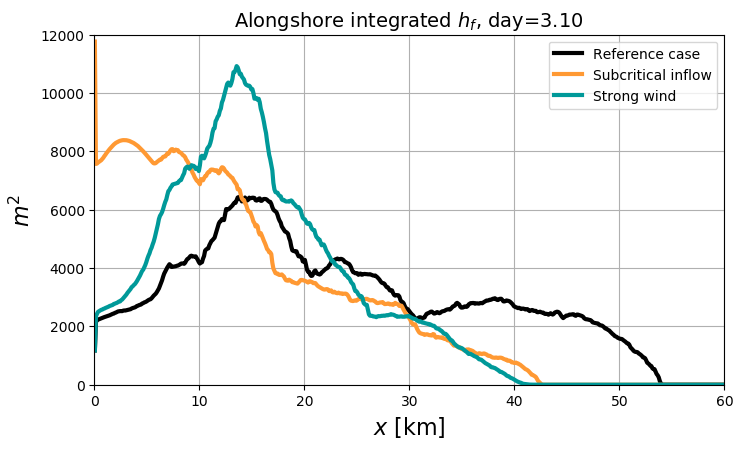

In [18]:

fig = plt.figure(figsize=(9, 5), dpi= 100, facecolor='w', edgecolor='k')
ax1 = fig.add_axes([0.15,0.15,0.7,0.7])  #left pos. bottom pos. width, height #ax1 = fig.add_subplot(111)


line1, =ax1.plot(xq7/1000,hf7_alongshore,linewidth=3,color = 'k')
line2, =ax1.plot(xq17/1000,hf17_alongshore,linewidth=3,color='#ff9933')
line3, =ax1.plot(xq18/1000,hf18_alongshore,linewidth=3,color='#009999')
ax1.set_title('Alongshore integrated $h_f$, day=%04.2f ' %(index/48.), fontsize=14)
ax1.set_xlabel('$x$ [km]',fontsize=16)
ax1.set_ylabel('$m^2$',fontsize=16)
ax1.set_xlim([0,60]);ax1.set_ylim([0,12000])
ax1.legend(['Reference case','Subcritical inflow','Strong wind'])
plt.grid()

In [19]:
def init():
    line1.set_ydata()
    line2.set_ydata()
    line3.set_ydata()
    return line1, line2, line3,
def animate(iter):    
    #z = file1.variables['e'][iter,1:121,450,:]
    if 0 <= iter <= 150:
        Salt7 = file7_1.variables['S'][iter,:,:,:]; Salt7[newmask7==0]=np.nan
        hf7=0.1*np.nansum((Sref7-Salt7)/34.0,axis=0)
        hf7[(mask7==0)]=-10000000

        Salt17 = file17_1.variables['S'][iter,:,:,:]; Salt17[newmask17==0]=np.nan
        hf17=0.1*np.nansum((Sref17-Salt17)/34.0,axis=0)
        hf17[(mask17==0)]=-10000000

        Salt18 = file18_1.variables['S'][iter,:,:,:]; Salt18[newmask18==0]=np.nan
        hf18=0.1*np.nansum((Sref18-Salt18)/34.0,axis=0)
        hf18[(mask18==0)]=-10000000

        hf7[(mask7==0)]=np.nan; hf17[(mask17==0)]=np.nan; hf18[(mask18==0)]=np.nan
        hf7_alongshore = np.nansum(hf7*100,axis=0) #100m grid spacing
        hf17_alongshore = np.nansum(hf17*100,axis=0) #100m grid spacing
        hf18_alongshore = np.nansum(hf18*100,axis=0) #100m grid spacing

        line1.set_ydata((hf7_alongshore))
        line2.set_ydata((hf17_alongshore))
        line3.set_ydata((hf18_alongshore))
        ax1.set_title('Alongshore integrated $h_f$, day=%04.2f ' %(iter/48.), fontsize=14)
    return line1,line2,line3
print('done')

done


In [20]:
anim = animation.FuncAnimation(fig,animate,frames=150,interval=100,blit=False,repeat=False)
print('done')

done


In [21]:

HTML(anim.to_jshtml())


In [22]:
anim.save('hfresh_integrated.gif', writer='imagemagick')

In [23]:
print('done')

done
